In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

/usr/lib/python3/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
df = pd.read_csv("./train.csv")
labels = df.pop("label").values
df = df.values.reshape(-1,28,28)

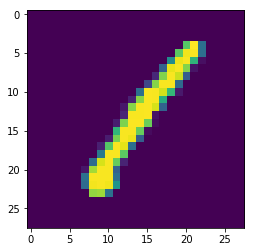

In [4]:
plt.imshow(df[0])

In [7]:
inputs = Input(shape=(28,28,1))

conv1 = Conv2D(32,6,activation="relu",input_shape=(28,28,1),padding="same")(inputs)
conv2 = Conv2D(64,4,activation="relu",padding="same")(conv1)
pool1 = MaxPool2D()(conv2)
conv3 = Conv2D(64,3,activation="relu")(pool1)
pool2 = MaxPool2D()(conv3)
flat = Flatten()(pool2)
dense = Dense(512,activation="relu")(flat)
dense = Dense(128,activation="relu")(dense)
dense = Dense(32,activation="relu")(dense)
encoder = Dense(2)(dense)
softmax = Dense(10,activation="softmax")(encoder)

model = Model(inputs,encoder)

model_ = Model(inputs,softmax)


In [9]:
model_.compile(optimizer="adam",loss="categorical_crossentropy",metrics=['accuracy'])

In [10]:
model_.fit(df.reshape(-1,28,28,1),pd.get_dummies(labels).values,epochs=15,batch_size=1000)

Train on 42000 samples
Epoch 1/15
42000/42000 [==============================] - 7s 169us/sample - loss: 3.2547 - accuracy: 0.2881
Epoch 2/15
42000/42000 [==============================] - 4s 97us/sample - loss: 1.0641 - accuracy: 0.5475
Epoch 3/15
42000/42000 [==============================] - 4s 98us/sample - loss: 0.8427 - accuracy: 0.5805
Epoch 4/15
42000/42000 [==============================] - 4s 97us/sample - loss: 0.6716 - accuracy: 0.6870
Epoch 5/15
42000/42000 [==============================] - 4s 98us/sample - loss: 0.4953 - accuracy: 0.8065
Epoch 6/15
42000/42000 [==============================] - 4s 97us/sample - loss: 0.3608 - accuracy: 0.8670
Epoch 7/15
42000/42000 [==============================] - 4s 97us/sample - loss: 0.2919 - accuracy: 0.8788
Epoch 8/15
42000/42000 [==============================] - 4s 99us/sample - loss: 0.2551 - accuracy: 0.8833
Epoch 9/15
42000/42000 [==============================] - 4s 99us/sample - loss: 0.2096 - accuracy: 0.8936
Epoch 10/15
4

In [14]:
compressed = model.predict(df.reshape(-1,28,28,1))

In [23]:
compressed = pd.DataFrame(np.concatenate((compressed,labels.reshape(-1,1)),axis=1),columns=['x','y','target'])

In [25]:
import plotly.express as ex

In [27]:
ex.scatter(data_frame=compressed,x='x',y='y',color='target')

In [28]:
inputs = Input(shape=(28,28,1))

conv1 = Conv2D(32,6,activation="relu",input_shape=(28,28,1),padding="same")(inputs)
conv2 = Conv2D(64,4,activation="relu",padding="same")(conv1)
pool1 = MaxPool2D()(conv2)
conv3 = Conv2D(64,3,activation="relu")(pool1)
pool2 = MaxPool2D()(conv3)
flat = Flatten()(pool2)
dense = Dense(512,activation="relu")(flat)
dense = Dense(128,activation="relu")(dense)
dense = Dense(32,activation="relu")(dense)
encoder = Dense(3)(dense)
softmax = Dense(10,activation="softmax")(encoder)

model = Model(inputs,encoder)

model_ = Model(inputs,softmax)


In [29]:
model_.compile(optimizer="adam",loss="categorical_crossentropy",metrics=['accuracy'])

In [30]:
model_.fit(df.reshape(-1,28,28,1),pd.get_dummies(labels).values,epochs=15,batch_size=1000)

Train on 42000 samples
Epoch 1/15
42000/42000 [==============================] - 5s 111us/sample - loss: 4.1899 - accuracy: 0.4885
Epoch 2/15
42000/42000 [==============================] - 4s 102us/sample - loss: 0.6344 - accuracy: 0.8029
Epoch 3/15
42000/42000 [==============================] - 4s 99us/sample - loss: 0.4403 - accuracy: 0.8460
Epoch 4/15
42000/42000 [==============================] - 4s 101us/sample - loss: 0.3361 - accuracy: 0.8631
Epoch 5/15
42000/42000 [==============================] - 4s 99us/sample - loss: 0.2612 - accuracy: 0.8761
Epoch 6/15
42000/42000 [==============================] - 4s 98us/sample - loss: 0.1929 - accuracy: 0.9327
Epoch 7/15
42000/42000 [==============================] - 4s 98us/sample - loss: 0.1002 - accuracy: 0.9762
Epoch 8/15
42000/42000 [==============================] - 4s 101us/sample - loss: 0.0733 - accuracy: 0.9811
Epoch 9/15
42000/42000 [==============================] - 4s 99us/sample - loss: 0.0548 - accuracy: 0.9857
Epoch 10/1

In [31]:
compressed = model.predict(df.reshape(-1,28,28,1))
compressed = pd.DataFrame(np.concatenate((compressed,labels.reshape(-1,1)),axis=1),columns=['x','y','z','target'])

In [32]:
ex.scatter_3d(data_frame=compressed,x='x',y='y',z='z',color='target')